# Machine Learning - Practical 1

Names: Rana Ashar Mehmood - Ahsan Ali - Muhammad Talha Abbas

This notebook provides you with the assignments and the overall code structure you need to complete the assignment. There are also questions that you need to answer in text form. Please use full sentences and reasonably correct spelling/grammar.

Regarding submission & grading:

- Work in groups of three and hand in your solution as a group.

- Solutions need to be uploaded to StudIP until the submission date indicated in the course plan. Please upload a copy of this notebook and a PDF version of it after you ran it.

- Solutions need to be presented to tutors in tutorial. Presentation dates are listed in the course plan. Every group member needs to be able to explain everything.

- You have to solve N-1 practicals to get admission to the exam.

- For plots you create yourself, all axes must be labeled. 

- Do not change the function interfaces.

In [ ]:
%matplotlib inline

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score

## The  dataset

The dataset consists of over 20.000 materials and lists their physical features. From these features, we want to learn how to predict the critical temperature, i.e. the temperature we need to cool the material to so it becomes superconductive. First load and familiarize yourself with the data set a bit.

In [ ]:
data = pd.read_csv('/content/superconduct_train.csv')
print(data.shape)

(21263, 82)


In [ ]:
data.head()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
0,4,88.944468,57.862692,66.361592,36.116612,1.181795,1.062396,122.90607,31.794921,51.968828,...,2.257143,2.213364,2.219783,1.368922,1.066221,1,1.085714,0.433013,0.437059,29.0
1,5,92.729214,58.518416,73.132787,36.396602,1.449309,1.057755,122.90607,36.161939,47.094633,...,2.257143,1.888175,2.210679,1.557113,1.047221,2,1.128571,0.632456,0.468606,26.0
2,4,88.944468,57.885242,66.361592,36.122509,1.181795,0.975980,122.90607,35.741099,51.968828,...,2.271429,2.213364,2.232679,1.368922,1.029175,1,1.114286,0.433013,0.444697,19.0
3,4,88.944468,57.873967,66.361592,36.119560,1.181795,1.022291,122.90607,33.768010,51.968828,...,2.264286,2.213364,2.226222,1.368922,1.048834,1,1.100000,0.433013,0.440952,22.0
4,4,88.944468,57.840143,66.361592,36.110716,1.181795,1.129224,122.90607,27.848743,51.968828,...,2.242857,2.213364,2.206963,1.368922,1.096052,1,1.057143,0.433013,0.428809,23.0


Because the dataset is rather large, we prepare a small subset of the data as training set, and another subset as test set. To make the computations reproducible, we set the random seed.

In [ ]:
data.columns

Index(['number_of_elements', 'mean_atomic_mass', 'wtd_mean_atomic_mass',
       'gmean_atomic_mass', 'wtd_gmean_atomic_mass', 'entropy_atomic_mass',
       'wtd_entropy_atomic_mass', 'range_atomic_mass', 'wtd_range_atomic_mass',
       'std_atomic_mass', 'wtd_std_atomic_mass', 'mean_fie', 'wtd_mean_fie',
       'gmean_fie', 'wtd_gmean_fie', 'entropy_fie', 'wtd_entropy_fie',
       'range_fie', 'wtd_range_fie', 'std_fie', 'wtd_std_fie',
       'mean_atomic_radius', 'wtd_mean_atomic_radius', 'gmean_atomic_radius',
       'wtd_gmean_atomic_radius', 'entropy_atomic_radius',
       'wtd_entropy_atomic_radius', 'range_atomic_radius',
       'wtd_range_atomic_radius', 'std_atomic_radius', 'wtd_std_atomic_radius',
       'mean_Density', 'wtd_mean_Density', 'gmean_Density',
       'wtd_gmean_Density', 'entropy_Density', 'wtd_entropy_Density',
       'range_Density', 'wtd_range_Density', 'std_Density', 'wtd_std_Density',
       'mean_ElectronAffinity', 'wtd_mean_ElectronAffinity',
       'gmean_

In [ ]:
target_clm = 'critical_temp'  # the critical temperature is our target variable
n_trainset = 200  # size of the training set
n_testset = 500  # size of the test set

In [ ]:
# set random seed to make sure every test set is the same
np.random.seed(seed=1)

idx = np.arange(data.shape[0])
idx_shuffled = np.random.permutation(idx)  # shuffle indices to split into training and test set

test_idx = idx_shuffled[:n_testset]
train_idx = idx_shuffled[n_testset:n_testset+n_trainset]
train_full_idx = idx_shuffled[n_testset:]

X_test = data.loc[test_idx, data.columns != target_clm].values
y_test = data.loc[test_idx, data.columns == target_clm].values
print('Test set shapes (X and y)', X_test.shape, y_test.shape)

X_train = data.loc[train_idx, data.columns != target_clm].values
y_train = data.loc[train_idx, data.columns == target_clm].values
print('Small training set shapes (X and y):', X_train.shape, y_train.shape)

X_train_full = data.loc[train_full_idx, data.columns != target_clm].values
y_train_full = data.loc[train_full_idx, data.columns == target_clm].values
print('Full training set shapes (X and y):', X_train_full.shape, y_train_full.shape)

Test set shapes (X and y) (500, 81) (500, 1)
Small training set shapes (X and y): (200, 81) (200, 1)
Full training set shapes (X and y): (20763, 81) (20763, 1)


## Task 1: Plot the dataset

To explore the dataset, use `X_train_full` and `y_train_full` for two descriptive plots:

* **Histogram** of the target variable. Use `plt.hist`.

* **Scatterplots** relating the target variable to one of the feature values. For this you will need 81 scatterplots. Arrange them in one big figure with 9x9 subplots. Use `plt.scatter`. You may need to adjust the marker size and the alpha blending value. 

Furthermore, we need to normalize the data, such that each feature has a mean of zero mean and a variance of one. Implement a function `normalize` which normalizes the data. Print the means and standard variation of the first five features before and after. For simplicity we will normalize train and test set independently. It is better practice to normalize the test set with mean and variance of the test set. Maybe you can think of situations / reasons where this makes a difference.

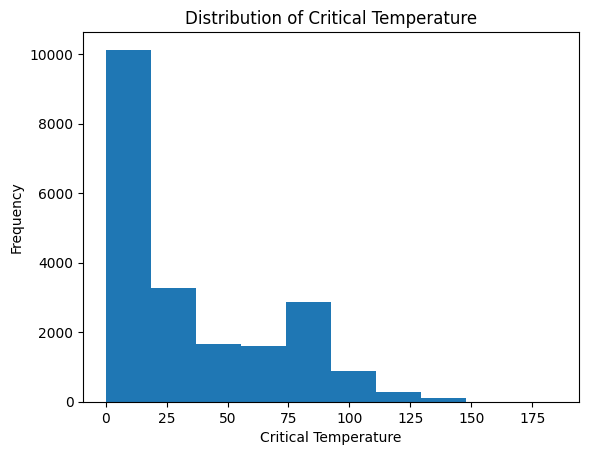

In [ ]:
# Histogram of the target variable
plt.hist(y_train_full)
plt.title('Distribution of Critical Temperature')
plt.xlabel('Critical Temperature')
plt.ylabel('Frequency')
plt.show()

In [ ]:
# Scatter plots of the target variable vs. features
from itertools import product
import matplotlib.cm as cm

cols = data.loc[train_full_idx, data.columns != target_clm].columns.values.tolist()
colormap = plt.cm.gist_ncar #nipy_spectral, Set1,Paired  
nrows=9
ncols=9
target = y_train_full
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(100,100))
colorst = [colormap(i) for i in np.linspace(0, 0.9,len(cols))]       
for i, j in product(range(nrows), range(ncols)):
     feature = X_train_full[:,i+j]
     ax[i, j].scatter(x=feature, y=target, s=1, color=colorst[i+j], alpha=0.7)
     ax[i, j].set_xlabel(cols[i+j])
     ax[i, j].set_ylabel('Critical Temperature')


In [ ]:
# Normalize
def normalize(X_train, X_test):
  
    mean_t = np.mean(X_train, axis=0)
    std_t = np.std(X_train, axis=0)
    mean = np.mean(X_test, axis=0)
    std = np.std(X_test, axis=0)
    X_train_norm = (X_train - mean_t) / std_t
    X_test_norm = (X_test - mean) / std
    return X_train_norm, X_test_norm

X_test_u = X_test
# print mean and standard deviation of the first five features before normalization
print("Before normalization:")
print("Train mean:", np.mean(X_train_full[:, :5], axis=0))
print("Train std:", np.std(X_train_full[:, :5], axis=0))
print("Test mean:", np.mean(X_test[:, :5], axis=0))
print("Test std:", np.std(X_test[:, :5], axis=0))

# normalize the data
X_train, X_test = normalize(X_train, X_test)

# print mean and standard deviation of the first five features after normalization
print("\nAfter normalization:")
print("Train mean:", np.mean(X_train[:, :5], axis=0))
print("Train std:", np.std(X_train[:, :5], axis=0))
print("Test mean:", np.mean(X_test[:, :5], axis=0))
print("Test std:", np.std(X_test[:, :5], axis=0))

Before normalization:
Train mean: [ 4.11221885 87.60808137 73.0498836  71.34256083 58.60335661]
Train std: [ 1.43960483 29.70299734 33.56235885 31.0755541  36.73208566]
Test mean: [ 4.24       85.46262336 70.43142339 69.13402426 55.90546242]
Test std: [ 1.4192956  28.44458924 30.20466364 28.97249373 32.96386687]

After normalization:
Train mean: [ 2.93098879e-16 -2.30926389e-16 -4.79616347e-16 -3.86357613e-16
  8.43769499e-17]
Train std: [1. 1. 1. 1. 1.]
Test mean: [-1.66977543e-16 -7.06990022e-16  2.55795385e-16  6.03961325e-17
 -5.68434189e-17]
Test std: [1. 1. 1. 1. 1.]


In [ ]:
abc_corr_critical_temp= data.corr()["critical_temp"].apply(lambda corr: abs(corr))
var_list= abc_corr_critical_temp[abc_corr_critical_temp>0.45].index
var_list

Index(['number_of_elements', 'entropy_atomic_mass', 'wtd_entropy_atomic_mass',
       'range_atomic_mass', 'entropy_fie', 'range_fie', 'std_fie',
       'wtd_std_fie', 'entropy_atomic_radius', 'wtd_entropy_atomic_radius',
       'range_atomic_radius', 'std_atomic_radius', 'wtd_std_atomic_radius',
       'gmean_Density', 'wtd_gmean_Density', 'entropy_Density',
       'entropy_FusionHeat', 'wtd_entropy_FusionHeat',
       'range_ThermalConductivity', 'wtd_range_ThermalConductivity',
       'std_ThermalConductivity', 'wtd_std_ThermalConductivity',
       'mean_Valence', 'wtd_mean_Valence', 'gmean_Valence',
       'wtd_gmean_Valence', 'entropy_Valence', 'wtd_entropy_Valence',
       'critical_temp'],
      dtype='object')

In [ ]:
df_data_selected= data[var_list].corr()
df_data_selected

NameError: ignored

Which material properties may be useful for predicting superconductivity? What other observations can you make?

The above mentioned features will effect the label(critical_temp) most eventually effecting the superconductivity. 

## Task 2:  Implement your own OLS estimator

We want to use linear regression to predict the critical temperature. Implement the ordinary least squares estimator without regularization 'by hand':

$w = (X^TX)^{-1}X^Ty$

To make life a bit easier, we provide a function that can be used to plot regression results. In addition it computes the mean squared error and the squared correlation between the true and predicted values. 

In [ ]:
def plot_regression_results(y_test, y_pred, weights):
    '''Produces three plots to analyze the results of linear regression:
        -True vs predicted
        -Raw residual histogram
        -Weight histogram

    Inputs:
        y_test: (n_observations,) numpy array with true values
        y_pred: (n_observations,) numpy array with predicted values
        weights: (n_weights) numpy array with regression weights'''

    print('MSE: ', mean_squared_error(y_test, y_pred))
    print('r^2: ', r2_score(y_test, y_pred))

    fig, ax = plt.subplots(1, 3, figsize=(9, 3))
    # predicted vs true
    ax[0].scatter(y_test, y_pred)
    ax[0].set_title('True vs. Predicted')
    ax[0].set_xlabel('True %s' % (target_clm))
    ax[0].set_ylabel('Predicted %s' % (target_clm))

    # residuals
    error = np.squeeze(np.array(y_test)) - np.squeeze(np.array(y_pred))
    ax[1].hist(np.array(error), bins=30)
    ax[1].set_title('Raw residuals')
    ax[1].set_xlabel('(true-predicted)')

    # weight histogram
    ax[2].hist(weights, bins=30)
    ax[2].set_title('weight histogram')

    plt.tight_layout()

As an example, we here show you how to use this function with random data. 

MSE:  2640.432578444892
r^2:  -1.108062856115481


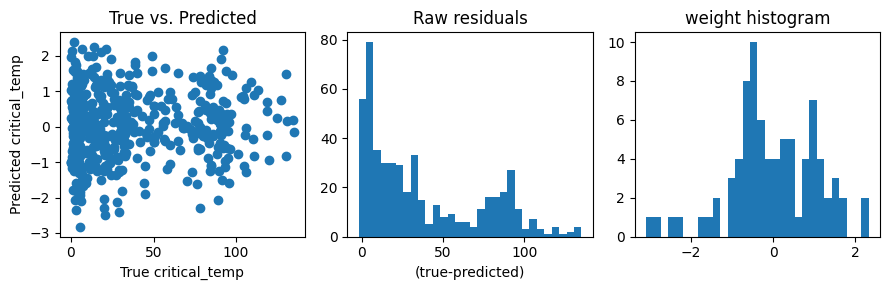

In [ ]:
# weights is a vector of length 82: the first value is the intercept (beta0), then 81 coefficients
weights = np.random.randn(82)

# Model predictions on the test set
y_pred_test = np.random.randn(y_test.size)

plot_regression_results(y_test, y_pred_test, weights)

Implement OLS linear regression yourself. Use `X_train` and `y_train` for estimating the weights and compute the MSE and $r^2$ from `X_test`. When you call our plotting function with the regession result, you should get mean squared error of 707.8.

In [ ]:
def OLS_regression(X_test, X_train, y_train):
    '''Computes OLS weights for linear regression without regularization on the training set and
       returns weights and testset predictions.

       Inputs:
         X_test: (n_observations, 81), numpy array with predictor values of the test set
         X_train: (n_observations, 81), numpy array with predictor values of the training set
         y_train: (n_observations,) numpy array with true target values for the training set

       Outputs:
         weights: The weight vector for the regerssion model including the offset
         y_pred: The predictions on the TEST set

       Note:
         Both the training and the test set need to be appended manually by a columns of 1s to add
         an offset term to the linear regression model.
    '''

    # ---------------- INSERT CODE ----------------------
    X_train = np.insert(X_train, 0, 1, axis=1)
    X_test = np.insert(X_test, 0, 1, axis=1)

    # Compute OLS weights using the formula
    # w = (X^T X)^-1 X^T y
    X_transpose = np.transpose(X_train)
    XTX = np.dot(X_transpose, X_train)
    XTX_inv = np.linalg.inv(XTX)
    XTy = np.dot(X_transpose, y_train)
    weights = np.dot(XTX_inv, XTy)

    # Predict on the test set using the learned weights
    y_pred = np.dot(X_test, weights)


    # ---------------- END CODE -------------------------

    return weights, y_pred

MSE:  707.8008845075002
r^2:  0.43490745935473774


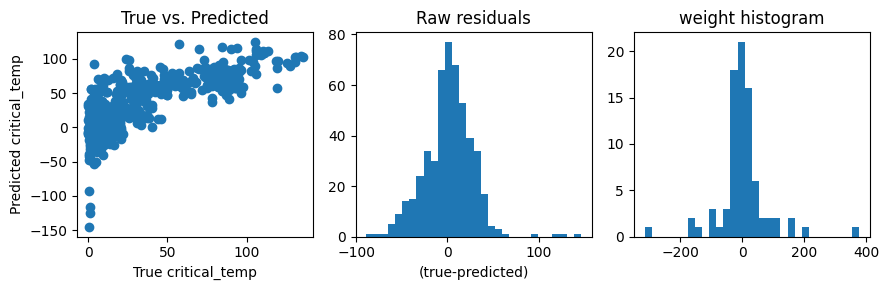

In [ ]:
# Plots of the results
weights, y_pred = OLS_regression(X_test, X_train, y_train)
plot_regression_results(y_test, y_pred, weights)

What do you observe? Is the linear regression model good?

Based on the MSE and r^2 values, we can observe that the linear regression model does not fit the data very well. The MSE of 707.80 indicates that the model has a high average error in predicting the target values. Additionally, the r^2 value of 0.43 indicates that the model explains only 43% of the variance in the target values, while the remaining 57% of the variance is not explained by the model.

Therefore, we can conclude that the linear regression model is not good for this dataset and we may need to explore more complex models to improve the model performance.

## Task 3: Compare your implementation to sklearn

Now, familarize yourself with the sklearn library. In the section on linear models:

https://scikit-learn.org/stable/modules/classes.html#module-sklearn.linear_model

you will find `sklearn.linear_model.LinearRegression`, the `sklearn` implementation of the OLS estimator. Use this sklearn class to implement OLS linear regression. Again obtain estimates of the weights on `X_train` and `y_train` and compute the MSE and $r^2$ on `X_test`.


In [ ]:
def sklearn_regression(X_test, X_train, y_train):
    '''Computes OLS weights for linear regression without regularization using the sklearn library on the training set and
       returns weights and testset predictions.

       Inputs:
         X_test: (n_observations, 81), numpy array with predictor values of the test set
         X_train: (n_observations, 81), numpy array with predictor values of the training set
         y_train: (n_observations,) numpy array with true target values for the training set

       Outputs:
         weights: The weight vector for the regerssion model including the offset
         y_pred: The predictions on the TEST set

       Note:
         The sklearn library automatically takes care of adding a column for the offset.
    '''
    
    # Create an instance of the LinearRegression class and fit the model to the training data
    lr = linear_model.LinearRegression()
    lr.fit(X_train, y_train)

    # Get the weight vector and use it to predict the test data
    weights = lr.coef_
    y_pred = lr.predict(X_test)

    # Compute the MSE and r2 scores on the test data
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    return weights, y_pred

MSE:  707.8008845059858
r^2:  0.4349074593559469


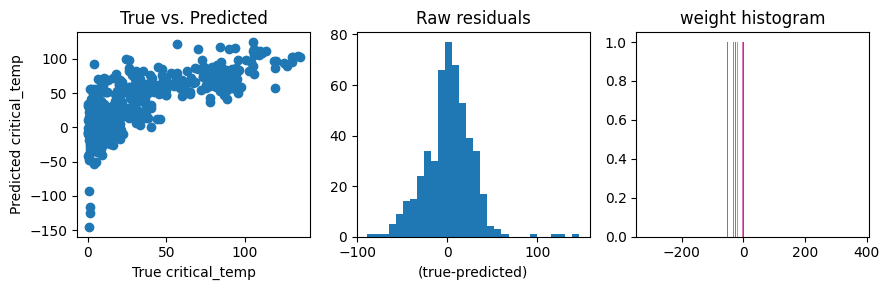

In [ ]:
weights, y_pred = sklearn_regression(X_test, X_train, y_train)
plot_regression_results(y_test, y_pred, weights[0])

If you implemented everything correctly, the MSE is again 707.8.

Fit the model using the larger training set, `X_train_full` and `y_train_full`, and again evaluate on `X_test`.

MSE:  329.86070104111826
r^2:  0.7366465263178439


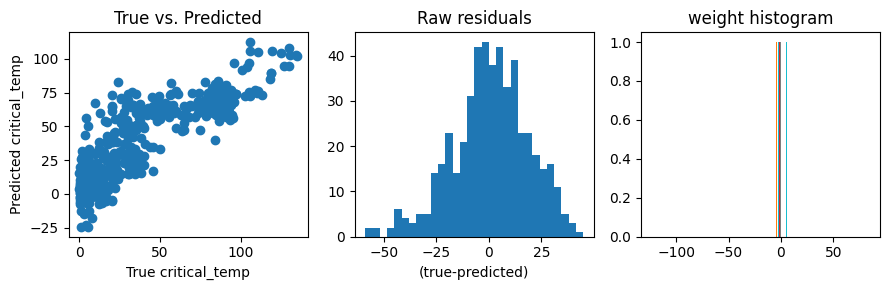

In [ ]:
weights, y_pred = sklearn_regression(X_test_u, X_train_full, y_train_full)
plot_regression_results(y_test, y_pred, weights)

 How does test set performance change? What else changes?

The second model has a lower MSE and a higher R^2 value than the first model. This indicates that the second model is better at explaining the variation in the data and making predictions. The first model may be underfitting the data, while the second model is a better fit. Therefore, the second model is considered to be a better linear regression model

## Task 4: Regularization with ridge regression

We will now explore how a penalty term on the weights can improve the prediction quality for finite data sets. Implement the analytical solution of ridge regression 

$w = (X^TX + \alpha I_D)^{-1}X^Ty$


as a function that can take different values of $\alpha$, the regularization strength, as an input. In the lecture, this parameter was called $\lambda$, but this is a reserved keyword in Python.

In [ ]:
def ridge_regression(X_test, X_train, y_train, alpha):
    '''Computes OLS weights for regularized linear regression with regularization strength alpha
       on the training set and returns weights and testset predictions.

       Inputs:
         X_test: (n_observations, 81), numpy array with predictor values of the test set
         X_train: (n_observations, 81), numpy array with predictor values of the training set
         y_train: (n_observations,) numpy array with true target values for the training set
         alpha: scalar, regularization strength

       Outputs:
         weights: The weight vector for the regression model including the offset
         y_pred: The predictions on the TEST set

       Note:
         Both the training and the test set need to be appended manually by a columns of 1s to add
         an offset term to the linear regression model.
    '''

    # ---------------- INSERT CODE ----------------------
    # Append a column of 1s to both X_train and X_test
    X_train = np.concatenate((np.ones((X_train.shape[0], 1)), X_train), axis=1)
    X_test = np.concatenate((np.ones((X_test.shape[0], 1)), X_test), axis=1)

    # Compute the ridge regression weights
    I = np.identity(X_train.shape[1])
    I[0, 0] = 0
    weights = np.linalg.inv(X_train.T @ X_train + alpha * I) @ X_train.T @ y_train

    # Make predictions on the test set
    y_pred = X_test @ weights


    # ---------------- END CODE -------------------------

    return weights, y_pred

Run the ridge regression on `X_train` with an alpha value of 10 and plot the obtained weights.

MSE:  420.6585672767902
r^2:  0.6641555220829645


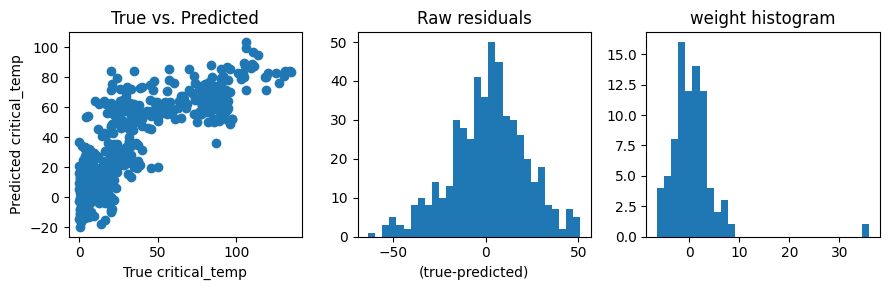

In [ ]:
# Run ridge regression with alpha=10
weights, y_pred = ridge_regression(X_test, X_train, y_train, 10)
# Plot regression results
plot_regression_results(y_test, y_pred, weights)

Now test a range of log-spaced $\alpha$s (~10-20), which cover several orders of magnitude, e.g. from 10^-7 to 10^7. 

* For each $\alpha$, you will get one model with one set of weights. 
* For each model, compute the error on the test set. 

Store both the errors and weights of all models for later use. You can use the function `mean_squared_error` from sklearn (imported above) to compute the MSE.


In [ ]:
alphas = np.logspace(-7, 7, 100)

# ---------------- INSERT CODE ----------------------
errors = []
weights = []
for alpha in alphas:
    w, y_pred = ridge_regression(X_test, X_train, y_train, alpha)
    weights.append(w.flatten())
    mse = mean_squared_error(y_test, y_pred)
    errors.append(mse)

# Convert weights and errors to numpy arrays
weights = np.array(weights)
errors = np.array(errors)

# ---------------- END CODE -------------------------

Make a single plot that shows for each coefficient how it changes with $\alpha$, i.e. one line per coefficient. Also think about which scale is appropriate for your $\alpha$-axis. You can set this using `plt.xscale(...)`.

Text(0, 0.5, 'weights')

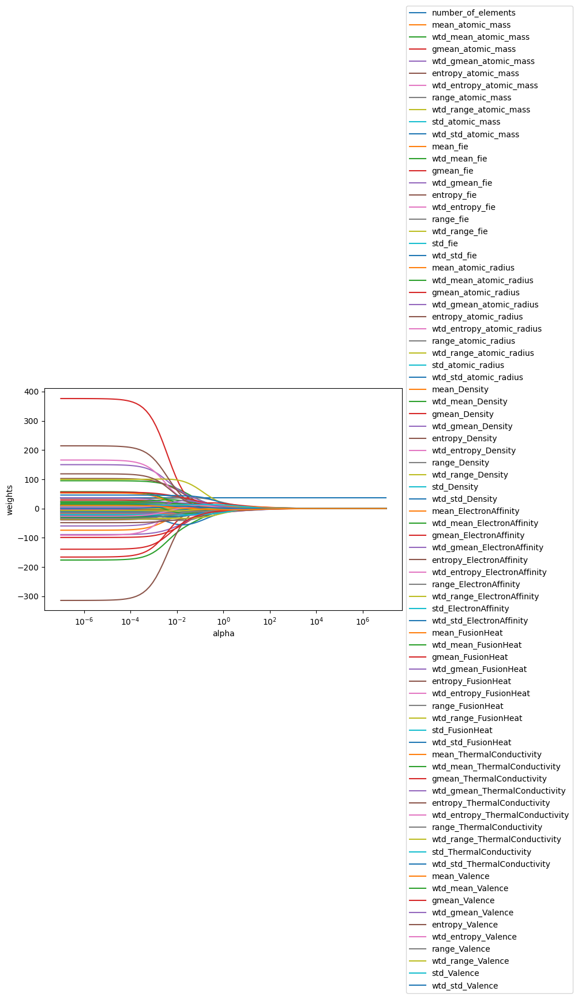

In [ ]:
# Plot of coefficients vs. alphas
cols = data.loc[train_full_idx, data.columns != target_clm].columns.values.tolist()
plt.figure(figsize=(10,5))
ax = plt.gca()
ax.plot(alphas, weights)
ax.set_xscale('log')
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
ax.legend(cols, loc='center left', bbox_to_anchor=(1, 0.5))
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('weights')

Why are the values of the weights largest on the left? Do they all change monotonically? 

The values of the weights are largest on the left because the regularization term adds a penalty to the sum of the squares of the weights. The weights are optimized to minimize the sum of squared errors and the regularization term, so some of the weights might be shrunk to zero, while the others are not.

Yes in this case almost all weights are changing monotonically.

Plot how the performance (i.e. the error) changes as a function of $\alpha$.

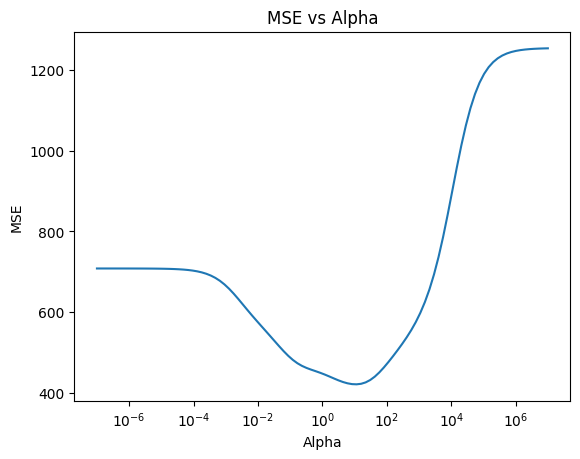

In [ ]:
# Plot of MSE  vs. alphas
plt.plot(alphas, errors)
plt.xscale('log')
plt.xlabel('Alpha')
plt.ylabel('MSE')
plt.title('MSE vs Alpha')
plt.show()

Which value of $\alpha$ gives the minimum MSE? Is it better than the unregularized model? Why should the curve reach ~700 on the left?

At 10^1 $\alpha$ gives the minimum MSE. It is ~450 which is much better then the unregularized model. At left the value of regularization is very small which donot makes much difference so the MSE is simmilar to unregularized model.

Now implement the same model using sklearn. Use the `linear_model.Ridge` object to do so.


In [ ]:
def ridge_regression_sklearn(X_test, X_train, y_train, alpha):
    '''Computes OLS weights for regularized linear regression with regularization strength alpha using the sklearn
       library on the training set and returns weights and testset predictions.

       Inputs:
         X_test: (n_observations, 81), numpy array with predictor values of the test set
         X_train: (n_observations, 81), numpy array with predictor values of the training set
         y_train: (n_observations,) numpy array with true target values for the training set
         alpha: scalar, regularization strength

       Outputs:
         weights: The weight vector for the regerssion model including the offset
         y_pred: The predictions on the TEST set

       Note:
         The sklearn library automatically takes care of adding a column for the offset.
    '''

    # ---------------- INSERT CODE ----------------------
    # Fit Ridge regression model
    ridge_reg = linear_model.Ridge(alpha=alpha)
    ridge_reg.fit(X_train, y_train)

    # Get predictions on test set
    y_pred = ridge_reg.predict(X_test)

    # Extract weights
    weights = ridge_reg.coef_


    # ---------------- END CODE -------------------------

    return weights, y_pred

This time, only plot how the performance changes as a function of $\alpha$. 

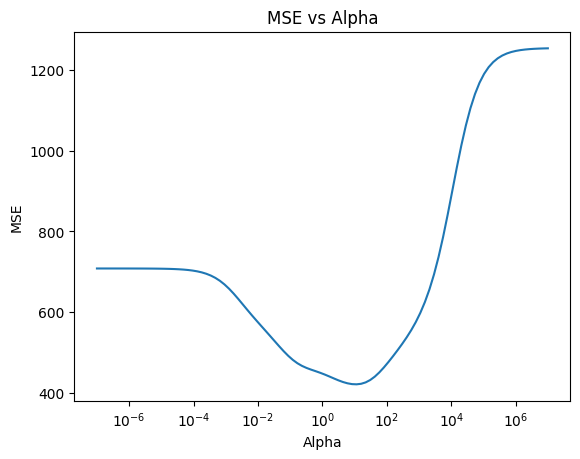

In [ ]:
# Plot of MSE  vs. alphas
alphas = np.logspace(-7, 7, 100)
errors = []
for alpha in alphas:
    w, y_pred = ridge_regression_sklearn(X_test, X_train, y_train, alpha)
    mse = mean_squared_error(y_test, y_pred)
    errors.append(mse)
# Convert weights to numpy array
errors = np.array(errors)
plt.plot(alphas, errors)
plt.xscale('log')
plt.xlabel('Alpha')
plt.ylabel('MSE')
plt.title('MSE vs Alpha')
plt.show()

Note: Don't worry if the curve is not exactly identical to the one you got above. The loss function we wrote down in the lecture  has $\alpha$ defined a bit differently compared to sklearn. However, qualitatively it should look the same.

## Task 5: Cross-validation

Until now, we always estimated the error on the test set directly. However, we typically do not want to tune hyperparameters of our inference algorithms like $\alpha$ on the test set, as this may lead to overfitting. Therefore, we tune them on the training set using cross-validation. As discussed in the lecture, the training data is here split in `n_folds`-ways, where each of the folds serves as a held-out dataset in turn and the model is always trained on the remaining data. Implement a function that performs cross-validation for the ridge regression parameter $\alpha$. You can reuse functions written above.

In [ ]:
def ridgeCV(X, y, n_folds, alphas):
    '''Runs a n_fold-crossvalidation over the ridge regression parameter alpha.
       The function should train the linear regression model for each fold on all values of alpha.

      Inputs:
        X: (n_obs, n_features) numpy array - predictor
        y: (n_obs,) numpy array - target
        n_folds: integer - number of CV folds
        alphas: (n_parameters,) - regularization strength parameters to CV over

      Outputs:
        cv_results_mse: (n_folds, len(alphas)) numpy array, MSE for each cross-validation fold

      Note:
        Fix the seed for reproducibility.
    '''

    cv_results_mse = np.zeros((n_folds, len(alphas)))
    np.random.seed(seed=2)

    # ---------------- INSERT CODE ----------------------

    # Shuffle data
    n_obs = X.shape[0]
    idx = np.random.permutation(n_obs)
    X_shuffled = X[idx]
    y_shuffled = y[idx]

    # Compute fold sizes
    fold_sizes = np.full(n_folds, n_obs // n_folds)
    fold_sizes[:n_obs % n_folds] += 1

    # Iterate over folds
    start, end = 0, 0
    for i in range(n_folds):
        end += fold_sizes[i]
        X_test_fold = X_shuffled[start:end]
        y_test_fold = y_shuffled[start:end]
        X_train_fold = np.concatenate((X_shuffled[:start], X_shuffled[end:]), axis=0)
        y_train_fold = np.concatenate((y_shuffled[:start], y_shuffled[end:]), axis=0)

        # Append column of ones for bias term
        X_train_fold = np.hstack((np.ones((X_train_fold.shape[0], 1)), X_train_fold))
        X_test_fold = np.hstack((np.ones((X_test_fold.shape[0], 1)), X_test_fold))

        # Train model for each alpha
        for j, alpha in enumerate(alphas):
            reg = linear_model.Ridge(alpha=alpha)
            reg.fit(X_train_fold, y_train_fold)
            y_pred = reg.predict(X_test_fold)
            cv_results_mse[i, j] = mean_squared_error(y_test_fold, y_pred)

        start = end

    # ---------------- END CODE -------------------------

    return cv_results_mse

Now we run 10-fold cross-validation using the training data of a range of $\alpha$s.

In [ ]:
alphas = np.logspace(-7, 7, 100)
mse_cv = ridgeCV(X_train, y_train, n_folds=10, alphas=alphas)

We plot the MSE trace for each fold separately:

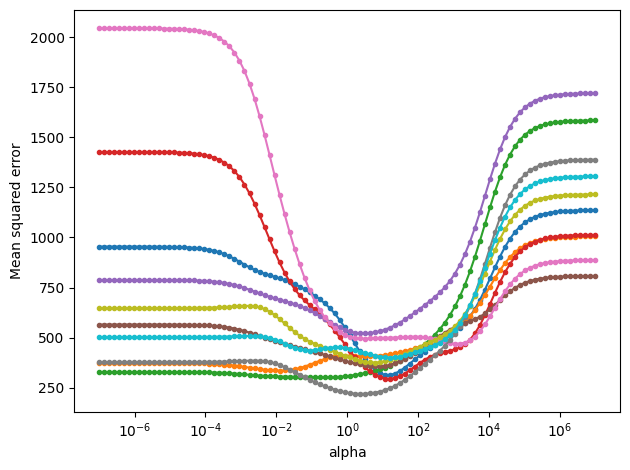

In [ ]:
plt.plot(alphas, mse_cv.T, '.-')
plt.xscale('log')
plt.xlabel('alpha')
plt.ylabel('Mean squared error')
plt.tight_layout()

We also plot the average across folds:

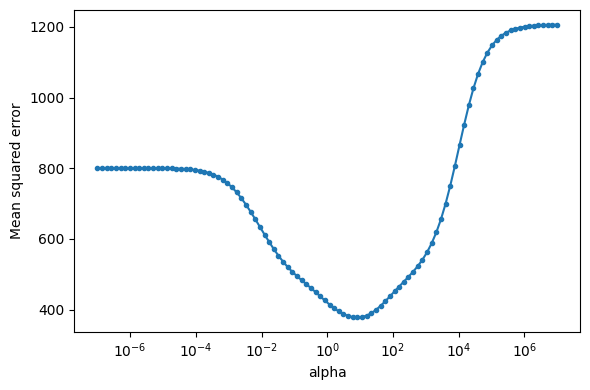

In [ ]:
plt.figure(figsize=(6, 4))
plt.plot(alphas, np.mean(mse_cv, axis=0), '.-')
plt.xscale('log')
plt.xlabel('alpha')
plt.ylabel('Mean squared error')
plt.tight_layout()

What is the optimal $\alpha$? Is it similar to the one found on the test set? Do the cross-validation MSE and the test-set MSE match well or differ strongly?

Optimal value of $\alpha$ is 10^1. Yes it is similar to the one found on test set. The MSE of CV is somehow better but there is not much difference.

We will now run cross-validation on the full training data. This will take a moment, depending on the speed of your computer. Afterwards, we will again plot the mean CV curves for the full data set (blue) and the small data set (orange).

In [ ]:
alphas = np.logspace(-7, 7, 100)
mse_cv_full = ridgeCV(X_train_full, y_train_full, n_folds=10, alphas=alphas)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=7.73321e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.07096e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.48316e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=2.05401e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarnin

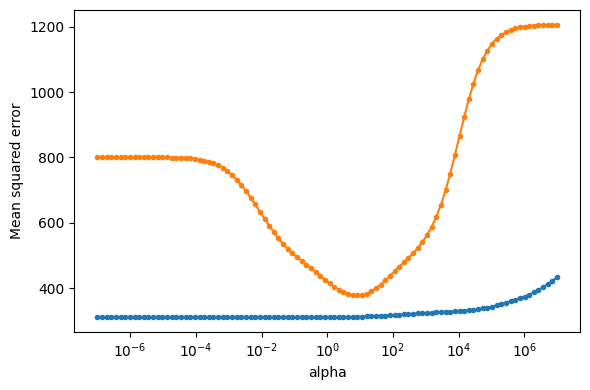

In [ ]:
plt.figure(figsize=(6, 4))
plt.plot(alphas, np.mean(mse_cv_full, axis=0), '.-')
plt.plot(alphas, np.mean(mse_cv, axis=0), '.-')
plt.xscale('log')
plt.xlabel('alpha')
plt.ylabel('Mean squared error')
plt.tight_layout()

We zoom in on the blue curve to the very left:

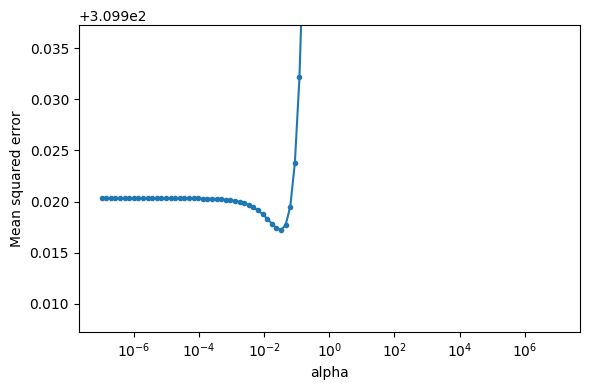

In [ ]:
plt.figure(figsize=(6, 4))
plt.plot(alphas, np.mean(mse_cv_full, axis=0), '.-')
plt.xscale('log')
minValue = np.min(np.mean(mse_cv_full, axis=0))
plt.ylim([minValue-.01, minValue+.02])
plt.xlabel('alpha')
plt.ylabel('Mean squared error')
plt.tight_layout()

Why does the CV curve on the full data set look so different? What is the optimal value of $\alpha$ and why is it so much smaller than on the small training set?

When the model was trained on small dataset it was not well generalized that is why CV curve is different in case of full data where model generalizes the data in a better way. 
Optimal value is around 10^-2 and it is smaller because previously in case of small data, the model was not well trained due to which the effect of individual data point over training was higher and regularization was required. While now in case of full data training the model is well generalized according to data and very least regularization is required.